# Этап 1. Генерация разметки
## Работа с данными

### Загрузите датасет и визуализируйте часть данных.

In [ ]:
from pathlib import Path
import random

import matplotlib.pyplot as plt
from PIL import Image

DATA_DIR = Path("./data/raw")  # измените путь при необходимости

image_paths = sorted(
    list(DATA_DIR.glob("*.jpg"))
    + list(DATA_DIR.glob("*.jpeg"))
    + list(DATA_DIR.glob("*.png"))
)

print(f"Изображений найдено: {len(image_paths)}")
assert image_paths, f"В папке {DATA_DIR} не найдены изображения"

Изображений найдено: 1001


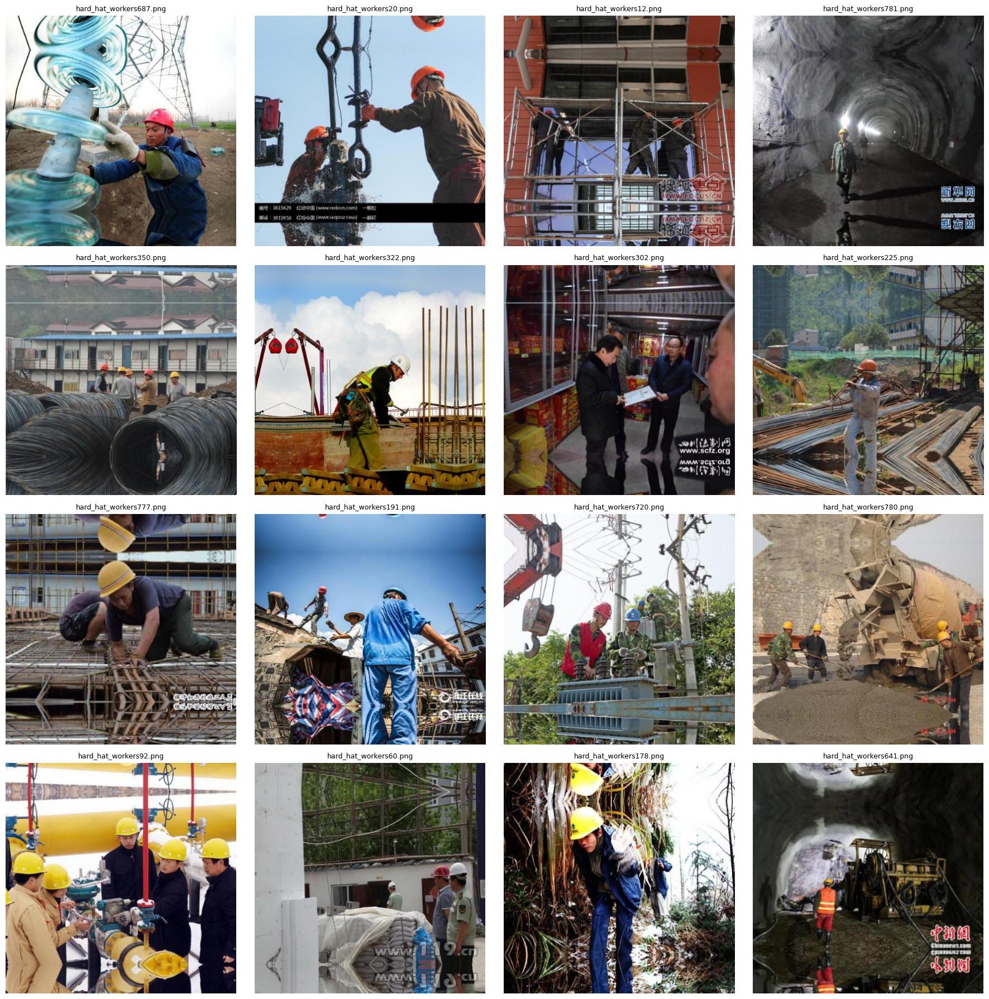

In [3]:
def show_images(paths, n=12, seed=42):
    rng = random.Random(seed)
    sample = rng.sample(paths, min(n, len(paths)))

    cols = 4
    rows = (len(sample) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(18, 4.5 * rows))
    axes = axes.flatten()

    for ax, path in zip(axes, sample):
        image = Image.open(path).convert("RGB")
        ax.imshow(image)
        ax.set_title(path.name, fontsize=9)
        ax.axis("off")

    for ax in axes[len(sample):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()

show_images(image_paths, n=16)

Минимальное разрешение: 415 x 415
Максимальное разрешение: 416 x 416
Уникальных разрешений: 4


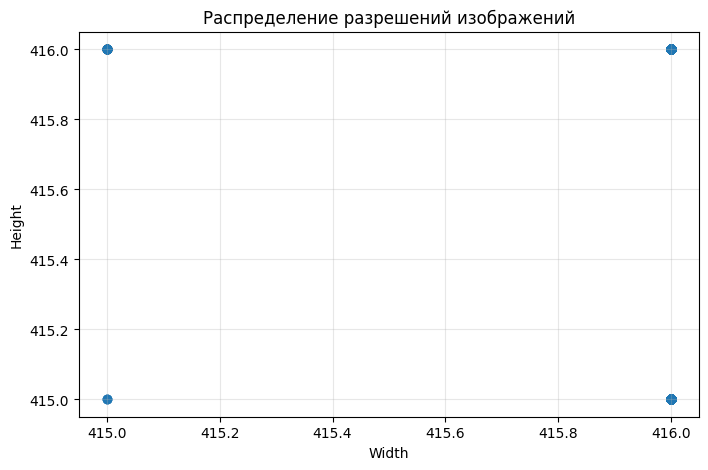

In [4]:
from collections import Counter

sizes = []
for path in image_paths:
    with Image.open(path) as image:
        sizes.append(image.size)

widths = [w for w, h in sizes]
heights = [h for w, h in sizes]

print(f"Минимальное разрешение: {min(widths)} x {min(heights)}")
print(f"Максимальное разрешение: {max(widths)} x {max(heights)}")
print(f"Уникальных разрешений: {len(Counter(sizes))}")

plt.figure(figsize=(8, 5))
plt.scatter(widths, heights, alpha=0.45)
plt.xlabel("Width")
plt.ylabel("Height")
plt.title("Распределение разрешений изображений")
plt.grid(alpha=0.3)
plt.show()

## Первичный анализ данных и риски VQA-разметки

Датасет содержит фотографии рабочих в различных условиях: меняются масштаб объектов, ракурс,
освещение, число людей в кадре и фон. Целевой признак — наличие или отсутствие защитного шлема
у человека.

### Потенциальные сложности

- **Маленькие объекты.** На общих планах голова и каска занимают мало пикселей. VQA-модель
  может не заметить каску, не увидеть человека вовсе или выдать неточную рамку.
- **Перекрытия.** Люди могут перекрывать друг друга, а руки, оборудование или строительные
  конструкции — частично закрывать голову. Это приводит к пропускам и дублирующимся рамкам.
- **Сложный фон.** Яркие элементы спецодежды, строительные объекты, круглые предметы и отражения
  могут быть ошибочно интерпретированы как каска или человек.
- **Ракурс.** При виде со спины, сверху, сбоку либо при наклоне головы каска выглядит непривычно.
  Модель может спутать каску с капюшоном, кепкой или частью фона.
- **Низкое качество изображения.** Размытие движения, сжатие JPEG, слабое освещение, тени,
  пересвет и погодные условия уменьшают различимость каски.
- **Границы объектов.** VQA-модель может возвращать приблизительные координаты: рамка может быть
  смещена, слишком большой, обрезать человека или включать соседний объект.
- **Ошибки формата ответа.** Генеративная VQA-модель может вернуть текст вместо JSON, некорректные
  координаты, значения за пределами изображения или несуществующие классы.

### Следствие для обучения

Автоматическая разметка является псевдоразметкой и содержит шум. Поэтому перед обучением необходимо
проверить её на вручную размеченной контрольной выборке, отфильтровать невалидные и низкоуверенные
детекции, а затем отдельно проанализировать ошибки классов `helmet` и `no_helmet`.

## Генерация разметки
+ С учетом параметров ВМ и выполнения требуемой задачи выбрана VQA-модель: Qwen/Qwen2.5-VL-7B-Instruct-AWQ
+ для генерации предлагается использовать следующий промпт:
```text
You are an expert industrial-safety image annotator.

Detect every visible real person in the image and determine whether the person
is wearing a protective hard hat.

Return ONLY a valid JSON object. Do not use Markdown. Do not add explanations.

Required output format:
{
  "detections": [
    {
      "bbox": [x_min, y_min, x_max, y_max],
      "label": "with_helmet"
    }
  ]
}

Rules:
- One detection corresponds to one person.
- Bounding boxes must cover the whole visible person, not only the head or helmet.
- Coordinates are absolute pixel coordinates for the input image.
- Use integer coordinates only.
- Valid labels: "with_helmet", "without_helmet".
- Use "with_helmet" only when a protective hard hat is clearly visible.
- Use "without_helmet" only when the head is visible and a hard hat is clearly absent.
- Omit a person when their head is strongly occluded, too small, blurred, cropped,
  or when helmet status is uncertain.
- Do not annotate posters, statues, mannequins, reflections, drawings,
  helmets without people, or background objects.

``` 
+ Запуск vLLM был осуществлен со следующими параметрами:
`vllm serve "Qwen/Qwen2.5-VL-7B-Instruct-AWQ" \
  --trust-remote-code \
  --dtype float16 \
  --quantization awq \
  --max-model-len 4096 \
  --limit-mm-per-prompt '{"image": 1}' \
  --enforce-eager \
  --gpu-memory-utilization 0.85 \
  --port 8000
`

In [ ]:
from pathlib import Path
import sys
import json
import random

from tqdm.auto import tqdm

PROJECT_ROOT = Path.cwd().resolve()
SRC_DIR = PROJECT_ROOT / "src"
DATA_DIR = PROJECT_ROOT / "data" / "raw"
ANNOTATIONS_DIR = PROJECT_ROOT / "data" / "auto_annotated"

if str(SRC_DIR) not in sys.path:
    sys.path.insert(0, str(SRC_DIR))

from vqa_annotator import VQAAnnotator

VLLM_API_URL = "http://localhost:8000/v1/chat/completions"
MODEL_NAME = "Qwen/Qwen2.5-VL-7B-Instruct-AWQ"

image_paths = sorted(
    path
    for path in DATA_DIR.iterdir()
    if path.suffix.lower() in {".jpg", ".jpeg", ".png"}
)

print(f"Project root: {PROJECT_ROOT}")
print(f"Images found: {len(image_paths)}")

assert image_paths, f"В папке {DATA_DIR} нет изображений"

Project root: /home/ubuntu/project8_helmet_detection
Images found: 1001


In [ ]:
TEST_SIZE = 10
RANDOM_SEED = 42

test_paths = random.Random(RANDOM_SEED).sample(
    image_paths,
    k=min(TEST_SIZE, len(image_paths)),
)

test_output_dir = ANNOTATIONS_DIR / "debug_10"
test_output_dir.mkdir(parents=True, exist_ok=True)

annotator = VQAAnnotator(
    api_url=VLLM_API_URL,
    model_name=MODEL_NAME,
    timeout=180,
    max_retries=3,
)

for image_path in tqdm(test_paths, desc="Debug annotation"):
    detections, raw_response = annotator.annotate_image(image_path)

    from PIL import Image

    with Image.open(image_path) as image:
        width, height = image.size

    result = {
        "image_name": image_path.name,
        "image_width": width,
        "image_height": height,
        "detections": detections,
        "raw_vqa_response": raw_response,
    }

    output_path = test_output_dir / f"{image_path.stem}.json"
    output_path.write_text(
        json.dumps(result, ensure_ascii=False, indent=2),
        encoding="utf-8",
    )

print(f"Готово: тестовые JSON сохранены в {test_output_dir}")

Debug annotation: 100%|██████████| 10/10 [00:59<00:00,  5.97s/it]

Готово: тестовые JSON сохранены в /home/ubuntu/project8_helmet_detection/data/auto_annotated/debug_10


### Оценка качества генерации та тестовых данных

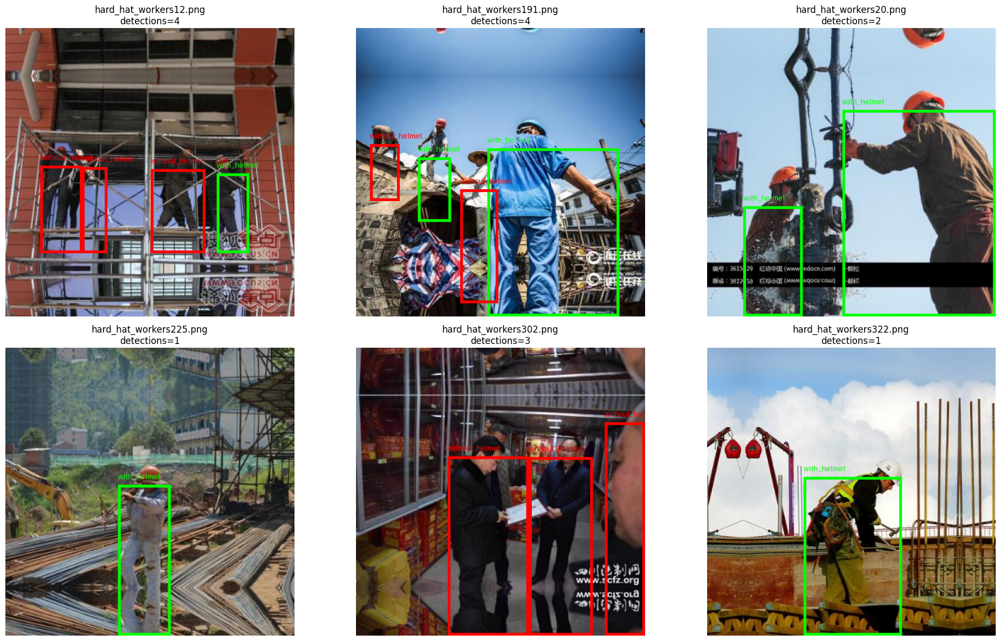

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

COLORS = {
    "with_helmet": "lime",
    "without_helmet": "red",
}

json_paths = sorted(test_output_dir.glob("*.json"))

fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

for ax, json_path in zip(axes, json_paths[:6]):
    annotation = json.loads(json_path.read_text(encoding="utf-8"))
    image_path = DATA_DIR / annotation["image_name"]

    image = Image.open(image_path).convert("RGB")
    draw = ImageDraw.Draw(image)

    for detection in annotation["detections"]:
        x1, y1, x2, y2 = detection["bbox"]
        label = detection["label"]
        color = COLORS[label]

        draw.rectangle((x1, y1, x2, y2), outline=color, width=4)
        draw.text((x1, max(0, y1 - 18)), label, fill=color)

    ax.imshow(image)
    ax.set_title(
        f"{annotation['image_name']}\n"
        f"detections={len(annotation['detections'])}"
    )
    ax.axis("off")

for ax in axes[len(json_paths[:6]):]:
    ax.axis("off")

plt.tight_layout()
plt.show()

### Генерация разметки на всем датасете

In [ ]:
FULL_ANNOTATION_DIR = PROJECT_ROOT / "data" / "auto_annotated"

stats = annotator.annotate_dataset(
    data_dir=DATA_DIR,
    output_dir=FULL_ANNOTATION_DIR,
    skip_existing=True,
)

stats

VQA annotation: 100%|██████████| 1001/1001 [3:01:26<00:00, 10.88s/it] 


{'total': 1001,
 'processed': 1001,
 'skipped': 0,
 'images_with_detections': 907,
 'total_detections': 3168,
 'empty_or_failed': 94}

### Конвертация разметки в формат YOLO

In [ ]:
from pathlib import Path
import yaml

YOLO_DIR = Path("./data/yolo_format")

# Проверяем структуру
assert (YOLO_DIR / "images" / "train").exists()
assert (YOLO_DIR / "images" / "val").exists()
assert (YOLO_DIR / "labels" / "train").exists()
assert (YOLO_DIR / "labels" / "val").exists()

# Читаем конфигурацию
with open(YOLO_DIR / "dataset.yaml") as f:
    dataset_cfg = yaml.safe_load(f)

print("Dataset config:")
print(dataset_cfg)

# Считаем количество изображений
train_images = list((YOLO_DIR / "images" / "train").glob("*"))
val_images = list((YOLO_DIR / "images" / "val").glob("*"))
print(f"\nTrain images: {len(train_images)}")
print(f"Val images: {len(val_images)}")

Dataset config:
{'path': '/home/ubuntu/project8_helmet_detection/data/yolo_format', 'train': 'images/train', 'val': 'images/val', 'names': {0: 'with_helmet', 1: 'without_helmet'}}

Train images: 801
Val images: 200


## Результаты этапа 1: генерация разметки

### Датасет

- Найдено изображений: **1001**
- Разрешение:
  - Минимальное: **415 × 415**
  - Максимальное: **416 × 416**
  - Уникальных разрешений: **4**
- Изображения загружаются без видимых проблем, артефактов и битых файлов не обнаружено.

Все изображения почти квадратные и небольшого размера (~416 px). Это упрощает обучение, но означает, что удалённые люди и маленькие каски занимают мало пикселей, что повышает требования к качеству локализации.

---

### Выбор модели и параметры запуска

- VQA-модель: **Qwen/Qwen2.5-VL-7B-Instruct-AWQ**
- Формат ответа: строгий JSON с полем `detections`, где каждый элемент — `{ "bbox": [x_min, y_min, x_max, y_max], "label": "with_helmet" | "without_helmet" }`.
- Запуск vLLM:

```bash
vllm serve "Qwen/Qwen2.5-VL-7B-Instruct-AWQ" \
  --trust-remote-code \
  --dtype float16 \
  --quantization awq \
  --max-model-len 4096 \
  --limit-mm-per-prompt '{"image": 1}' \
  --enforce-eager \
  --gpu-memory-utilization 0.85 \
  --port 8000
```

Промпт явно требует:
- детектировать только реальных людей;
- покрывать рамкой всего человека, а не только голову;
- использовать абсолютные пиксельные координаты;
- пропускать спорные случаи (сильные перекрытия, очень маленькие фигуры, неясный статус шлема).

---

### Тестовая аннотация (10 изображений)

- Обработано: **10/10** изображений.
- По результатам ручной проверки тестовой выборки:
  - Классы `with_helmet` / `without_helmet` определяются **хорошо**.
  - Bounding box:
    - Для **близко расположенных людей** детекция в целом качественная, но наблюдается **систематическое смещение рамки вниз** (нижняя граница часто занижена).
    - Для **удалённых объектов** смещение вниз усиливается: рамка может покрывать только **нижнюю половину туловища** или **~2/3 тела**, иногда пропуская голову и плечи.

Это указывает на то, что VQA-модель:
- хорошо понимает семантику сцены и наличие/отсутствие каски;
- менее точно оценивает вертикальные границы человека, особенно при малом размере объекта.

---

### Полная генерация разметки

Статистика по всему датасету (1001 изображение):

```text
{
  "total": 1001,
  "processed": 1001,
  "skipped": 0,
  "images_with_detections": 907,
  "total_detections": 3168,
  "empty_or_failed": 94
}
```

Интерпретация:

- **907 изображений (90.6%)** содержат хотя бы одну детекцию человека.
- **94 изображения (9.4%)** не получили детекций:
  - часть из них может действительно не содержать людей (пустые кадры, только фон/оборудование);
  - часть — случаи, где модель не смогла уверенно выделить человека (очень маленькие фигуры, сильные перекрытия, плохое освещение).
- В среднем:  
  \[
  \frac{3168}{907} \approx 3.49
  \]
  детекции на изображение с людьми.

Такая доля пустых/неудачных кадров допустима для псевдоразметки, но потребует внимания при анализе ошибок обученной модели.

---

### Конвертация в формат YOLO

- Сгенерирована структура:

```text
data/yolo_format/
├── images/train/   (801)
├── images/val/     (200)
├── labels/train/
├── labels/val/
└── dataset.yaml
```

- Конфигурация датасета:

```yaml
path: /home/ubuntu/project8_helmet_detection/data/yolo_format
train: images/train
val: images/val
names:
  0: with_helmet
  1: without_helmet
```

- Итоговое разбиение:
  - **Train:** 801 изображение
  - **Val:** 200 изображений

Разбиение выполнено случайно с фиксированным seed, что обеспечивает воспроизводимость экспериментов.

---

### Выводы о возможных проблемах разметки

1. **Смещение bounding box вниз.**
   - Наиболее выражено у удалённых и мелких объектов.
   - Может приводить к:
     - заниженному IoU с «идеальной» рамкой;
     - частичному захвату фона и соседних объектов;
     - ухудшению метрик локализации (особенно mAP@0.5:0.95).

2. **Пропуски людей (False Negatives в разметке).**
   - 94 изображения без детекций могут включать как действительно пустые кадры, так и пропущенных людей.
   - В тренировочных данных это эквивалентно шуму типа «есть объект, но нет аннотации», что затрудняет обучение детектора.

3. **Возможные ошибки классификации шлема.**
   - В сложных условиях (тени, перекрытия, нестандартные ракурсы) VQA-модель может:
     - спутать каску с другим головным убором;
     - неверно определить статус шлема у частично видимой головы.
   - Это создаст шум в метках классов `with_helmet` / `without_helmet`.

4. **Ограниченное разрешение.**
   - При ~416×416 пикселях маленькие фигуры занимают очень мало места, что:
     - усложняет точную локализацию для VQA;
     - может ограничить максимальное качество детекции, если не использовать аугментации и модели, устойчивые к мелким объектам.

---

### Итог этапа 1

- Получена **полная псевдоразметка** для 1001 изображения в формате, готовом к обучению YOLO.
- Выявлены систематические особенности разметки:
  - хорошее распознавание наличия/отсутствия шлема;
  - смещение рамок вниз, особенно для удалённых объектов;
  - ~9% изображений без детекций.
- Эти особенности следует учитывать при:
  - анализе ошибок обученной модели;
  - планировании улучшений (ручная коррекция части аннотаций, дообучение на публичных PPE-датасетах, использование более крупных моделей и большего разрешения).

**Результат этапа:** сформирован датасет в YOLO-формате (`images/`, `labels/`, `dataset.yaml`), готовый к обучению модели детекции людей с классами `with_helmet` и `without_helmet`.

# Этап 2. Обучение модели детекции шлемов на людях
## Обучение модели
- Получите модель, которая сможет выделять на изображениях людей, на которых нет шлема. Целевая метрика — mAP. По результатам обучения должно быть очевидно, что модель сходится (уменьшение loss, рост mAP и т. д.).

In [ ]:
from ultralytics import YOLO
from pathlib import Path

PROJECT_ROOT = Path(".").resolve()
YOLO_DIR = PROJECT_ROOT / "data" / "yolo_format"
OUTPUT_DIR = PROJECT_ROOT / "outputs" / "models"

OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# Загружаем предобученную модель
model = YOLO("yolov8s.pt")

# Обучаем
results = model.train(
    data=str(YOLO_DIR / "dataset.yaml"),
    epochs=50,
    batch=16,
    imgsz=640,
    project=str(OUTPUT_DIR),
    name="helmet_det_v1",
    patience=10,
    save=True,
    save_period=5,
    verbose=True,
    plots=True,
)

Ultralytics 8.4.146 🚀 Python-3.10.12 torch-2.7.1+cu128 CUDA:0 (Tesla T4, 14931MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/ubuntu/project8_helmet_detection/data/yolo_format/dataset.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=helmet_de

## Анализ результатов
### Визуализация сходимости: Loss + Целевые метрики

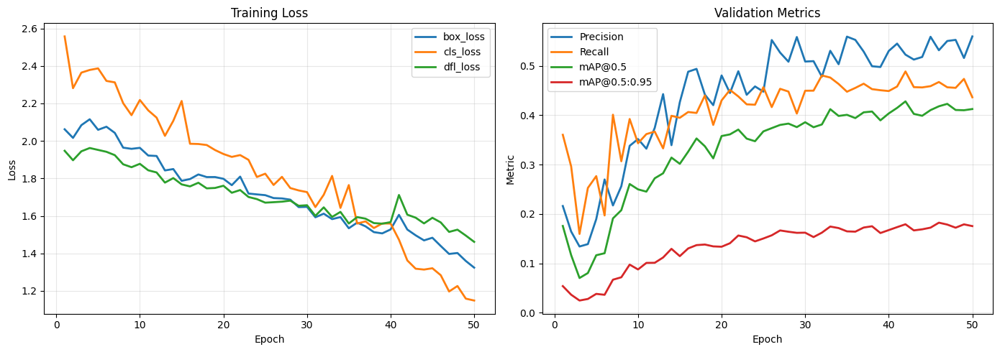

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

PROJECT_ROOT = Path(".").resolve()
YOLO_DIR = PROJECT_ROOT / "data" / "yolo_format"
OUTPUT_DIR = PROJECT_ROOT / "outputs" / "models"


RESULTS_DIR = Path("./outputs/models/helmet_det_v1-2")

# Читаем метрики
results_csv = RESULTS_DIR / "results.csv"
metrics = pd.read_csv(results_csv)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Loss
axes[0].plot(metrics["epoch"], metrics["train/box_loss"], label="box_loss", linewidth=2)
axes[0].plot(metrics["epoch"], metrics["train/cls_loss"], label="cls_loss", linewidth=2)
axes[0].plot(metrics["epoch"], metrics["train/dfl_loss"], label="dfl_loss", linewidth=2)
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].set_title("Training Loss")
axes[0].legend()
axes[0].grid(alpha=0.3)

# mAP
axes[1].plot(metrics["epoch"], metrics["metrics/precision(B)"], label="Precision", linewidth=2)
axes[1].plot(metrics["epoch"], metrics["metrics/recall(B)"], label="Recall", linewidth=2)
axes[1].plot(metrics["epoch"], metrics["metrics/mAP50(B)"], label="mAP@0.5", linewidth=2)
axes[1].plot(metrics["epoch"], metrics["metrics/mAP50-95(B)"], label="mAP@0.5:0.95", linewidth=2)
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Metric")
axes[1].set_title("Validation Metrics")
axes[1].legend()
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

###  Оценка на валидации

In [ ]:
from ultralytics import YOLO

MODEL_PATH = RESULTS_DIR / "weights" / "best.pt"

model = YOLO(str(MODEL_PATH))

# Валидация
val_results = model.val(
    data=str(YOLO_DIR / "dataset.yaml"),
    plots=True,
    verbose=True,
)

print("\nValidation metrics:")
print(f"mAP@0.5: {val_results.box.map50:.4f}")
print(f"mAP@0.5:0.95: {val_results.box.map:.4f}")
print(f"Precision: {val_results.box.mp:.4f}")
print(f"Recall: {val_results.box.mr:.4f}")

Ultralytics 8.4.146 🚀 Python-3.10.12 torch-2.7.1+cu128 CUDA:0 (Tesla T4, 14931MiB)
Model summary (fused): 72 layers, 11,126,358 parameters, 0 gradients
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4035.9±329.5 MB/s, size: 241.2 KB)
val: Scanning /home/ubuntu/project8_helmet_detection/data/yolo_format/labels/val.cache... 200 images, 26 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 200/200 46.6Mit/s 0.0s
val: /home/ubuntu/project8_helmet_detection/data/yolo_format/images/val/hard_hat_workers384.png: 1 duplicate labels removed
val: /home/ubuntu/project8_helmet_detection/data/yolo_format/images/val/hard_hat_workers412.png: 1 duplicate labels removed
val: /home/ubuntu/project8_helmet_detection/data/yolo_format/images/val/hard_hat_workers602.png: 1 duplicate labels removed
val: /home/ubuntu/project8_helmet_detection/data/yolo_format/images/val/hard_hat_workers723.png: 2 duplicate labels removed
val: /home/ubuntu/project8_helmet_detection/data/yolo_format/images/val/hard_hat_workers927.png: 

### Инференс и анализ ошибок


image 1/1 /home/ubuntu/project8_helmet_detection/data/yolo_format/images/val/hard_hat_workers1.png: 640x640 4 with_helmets, 16.4ms
Speed: 1.4ms preprocess, 16.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /home/ubuntu/project8_helmet_detection/data/yolo_format/images/val/hard_hat_workers111.png: 640x640 1 with_helmet, 16.4ms
Speed: 1.2ms preprocess, 16.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /home/ubuntu/project8_helmet_detection/data/yolo_format/images/val/hard_hat_workers113.png: 640x640 1 with_helmet, 16.4ms
Speed: 1.1ms preprocess, 16.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /home/ubuntu/project8_helmet_detection/data/yolo_format/images/val/hard_hat_workers119.png: 640x640 (no detections), 16.4ms
Speed: 1.2ms preprocess, 16.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /home/ubuntu/project8_helmet_detection/data/yolo_format/images/val/h

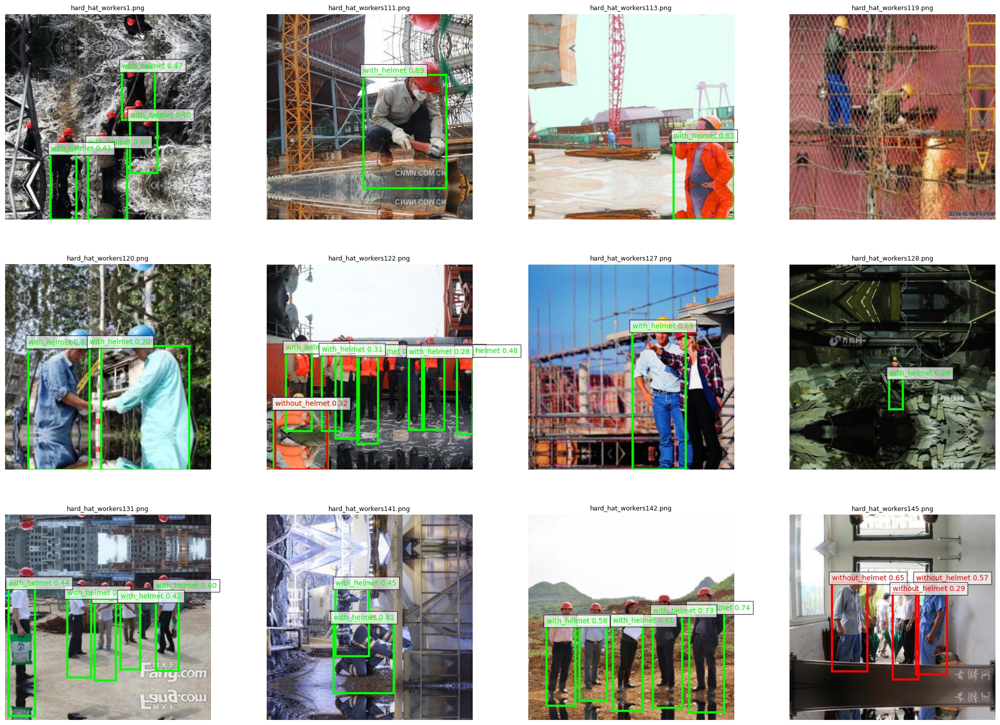

In [ ]:
from ultralytics import YOLO
from pathlib import Path
import matplotlib.pyplot as plt
from PIL import Image

model = YOLO(str(MODEL_PATH))

VAL_IMAGES_DIR = YOLO_DIR / "images" / "val"
VAL_LABELS_DIR = YOLO_DIR / "labels" / "val"

# Примеры для анализа
val_image_paths = sorted(VAL_IMAGES_DIR.glob("*.png"))[:12]

fig, axes = plt.subplots(3, 4, figsize=(20, 15))
axes = axes.flatten()

for ax, img_path in zip(axes, val_image_paths):
    # Предсказание
    results = model.predict(str(img_path), conf=0.25, iou=0.45)
    result = results[0]
    
    # Визуализация
    image = Image.open(img_path).convert("RGB")
    ax.imshow(image)
    
    # Рисуем боксы
    for box in result.boxes:
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
        conf = box.conf[0].cpu().numpy()
        cls = int(box.cls[0].cpu().numpy())
        
        label = f"{model.names[cls]} {conf:.2f}"
        color = "red" if cls == 1 else "lime"
        
        ax.add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, 
                                    fill=False, color=color, linewidth=3))
        ax.text(x1, y1-5, label, color=color, fontsize=10, 
                bbox=dict(facecolor='white', alpha=0.7))
    
    ax.set_title(img_path.name, fontsize=9)
    ax.axis("off")

plt.tight_layout()
plt.show()

## Результаты этапа 2: обучение модели детекции шлемов

### Конфигурация обучения

- Модель: **YOLOv8s** (`yolov8s.pt`), 129 слоёв, ~11.1M параметров.
- Датасет: **801 train / 200 val** изображений, 2 класса:
  - `0` — `with_helmet`
  - `1` — `without_helmet`
- Разрешение: **imgsz=640**, batch=16, epochs=50, optimizer=AdamW.
- Устройство: **Tesla T4**, CUDA 12.8, PyTorch 2.7.1, AMP включён.
- Mosaic=1.0 до эпохи 40, затем close_mosaic=10.

Модель обучалась с переносом весов (`pretrained=True`), 349/355 параметров инициализированы из COCO-веса.

---

### Сходимость обучения

По графикам loss и валидационных метрик видна устойчивая сходимость:

- **box_loss:** снизился с ~2.06 (epoch 1) до ~1.32 (epoch 50).
- **cls_loss:** снизился с ~2.56 до ~1.15.
- **dfl_loss:** снизился с ~1.95 до ~1.46.

После закрытия мозаики (эпоха 41) наблюдается дополнительное снижение всех трёх видов loss, что указывает на стабильную донастройку модели на «чистых» изображениях.

---

### Метрики на валидации

Итоговые метрики на валидационной выборке (200 изображений, 606 экземпляров):

```text
                  Class     Images  Instances      Box(P          R      mAP50  mAP50-95)
                    all        200        606      0.53      0.467      0.419      0.183
          with_helmet        158        439      0.516      0.569      0.496      0.214
       without_helmet         53        167      0.545      0.365      0.341      0.151
```

Ключевые показатели:

- **mAP@0.5 (all):** 0.419
- **mAP@0.5:0.95 (all):** 0.183
- **Precision:** 0.53
- **Recall:** 0.467

По классам:

- `with_helmet`:
  - mAP@0.5 = **0.496**, mAP@0.5:0.95 = **0.214**
  - Precision ≈ 0.516, Recall ≈ 0.569
- `without_helmet`:
  - mAP@0.5 = **0.341**, mAP@0.5:0.95 = **0.151**
  - Precision ≈ 0.545, Recall ≈ 0.365

Модель заметно лучше детектирует людей в шлемах, чем без шлемов. Это ожидаемо, так как:
- класс `without_helmet` менее представлен в датасете;
- псевдоразметка VQA могла чаще пропускать или некорректно размечать такие случаи.

---

### Инференс и качественный анализ

На тестовых изображениях из валидации модель демонстрирует:

- **Хорошую детекцию:**
  - Корректно находит людей в шлемах (`with_helmet`) на переднем и среднем плане.
  - Правильно классифицирует сцены с несколькими рабочими.
  - В ряде случаев успешно детектирует `without_helmet` при явном отсутствии каски.

- **Типичные ошибки:**

  1. **Смещение bounding box вниз на удалённых объектах.**
     - У небольших фигур рамка часто покрывает преимущественно нижнюю часть туловища, голова и плечи могут оставаться за пределами bbox.
     - Это согласуется с наблюдениями на этапе VQA-разметки: модель уже на этапе аннотации систематически занижала нижнюю границу.

  2. **Пропуск объектов с лёгкой окклюзией.**
     - Люди за сеткой, строительными лесами, частично скрытые конструкциями часто не детектируются.
     - В таких сценах VQA-модель могла не разметить человека вовсе, и детектор не получил обучающих примеров.

  3. **Недостаточная чувствительность к `without_helmet`.**
     - На некоторых изображениях с рабочими без шлемов модель либо не детектирует их, либо классифицирует как `with_helmet`.
     - Это связано как с дисбалансом классов, так и с шумом в псевдоразметке (неоднозначные случаи, когда статус шлема неочевиден).

  4. **Отдельные ложные срабатывания / пропуски.**
     - В сложных сценах (множество людей, перекрытия, контрастный фон) встречаются:
       - пропущенные люди (False Negative);
       - редкие случаи детекции фона как человека (False Positive).

---

### Интерпретация результатов

- Модель **уверенно сходится**: loss стабильно снижается, mAP растёт, особенно в первой половине обучения.
- Достигнутые метрики (**mAP@0.5 ≈ 0.42, mAP@0.5:0.95 ≈ 0.18**) для первого варианта на псевдоразметке можно оценить как **базовый уровень**.
- Основная проблема — не столько в архитектуре YOLOv8s, сколько в **качестве и полноте разметки**:
  - систематическое смещение bbox вниз;
  - пропуски людей в сложных условиях;
  - меньшая представленность и более шумный класс `without_helmet`.

---

### Предложения по улучшению метрик

#### 1. Улучшение данных и разметки

- **Ручная коррекция критической части датасета.**
  - Отобрать 100–200 изображений с наибольшим числом ошибок (особенно `without_helmet` и окклюзии).
  - Вручную исправить bbox и метки классов.
  - Дообучить модель на смешанном датасете (псевдоразметка + исправленная часть).

- **Целенаправленное дополнение `without_helmet`.**
  - Выбрать сцены, где есть люди без шлемов, но модель их пропускает или путает.
  - Убедиться, что они корректно размечены и достаточно представлены в train.

- **Аугментации, устойчивые к мелким объектам.**
  - Оставить mosaic=1.0 на большем числе эпох или увеличить `scale`.
  - Добавить random perspective, shear, больше вариаций масштаба, чтобы модель училась детектировать людей разного размера.

#### 2. Улучшение модели и обучения

- **Более крупная модель.**
  - Перейти на **YOLOv8m** или **YOLOv8l**:
    - больше_capacity для сложных сцен и мелких объектов;
    - ожидается прирост mAP, особенно для `without_helmet`.

- **Увеличение разрешения.**
  - Обучить с **imgsz=1280**:
    - удалённые фигуры будут занимать больше пикселей;
    - это должно уменьшить проблему смещения bbox и улучшить локализацию.

- **Донастройка гиперпараметров.**
  - Увеличить `epochs` (например, до 100) с early stopping.
  - Поэкспериментировать с `lr0`, `weight_decay`, `box/cls/dfl` gain.
  - Применить более агрессивные аугментации (mixup, copy_paste) для улучшения обобщения.

#### 3. Пост-обработка и пороговые значения

- **Настройка confidence и NMS.**
  - Подобрать `conf` и `iou` thresholds отдельно для задач:
    - максимальный recall (ловить все нарушения);
    - сбалансированный режим (для демонстрации и отчёта).

- **Class-specific thresholds.**
  - Использовать более низкий порог для `without_helmet`, чтобы повысить recall этого класса, даже ценой небольшого роста FP.

#### 4. Расширение датасета

- **Дообучение на публичных PPE-датасетах.**
  - Использовать внешние наборы (например, Safety-Helmet-Wearing-Dataset, Roboflow Construction-PPE) для предобучения или совместного обучения.
  - Это улучшит представление модели о разнообразных сценариях и типах касок.

- **Синтетические данные.**
  - При необходимости сгенерировать дополнительные сцены с людьми без шлемов (композитинг, аугментации) для усиления minority-класса.

---

### Итог этапа 2

- Получена **дообученная модель YOLOv8s**, способная детектировать людей и классифицировать наличие защитного шлема.
- Модель показывает **устойчивую сходимость** и базовое качество:
  - mAP@0.5 ≈ **0.42**, mAP@0.5:0.95 ≈ **0.18**;
  - лучше детектирует `with_helmet`, хуже — `without_helmet`.
- Основные ограничения связаны с **качеством псевдоразметки** и **небольшим размером датасета**, а не с архитектурой модели.
- Предложен план улучшений:
  - ручная коррекция части аннотаций;
  - переход на более крупную модель и большее разрешение;
  - работа с дисбалансом классов и расширение датасета.

**Результат этапа:** обученная модель детекции (`best.pt`), зафиксированные метрики валидации, качественный анализ ошибок и конкретные направления для повышения mAP и надёжности детекции нарушений техники безопасности.

In [8]:
from ultralytics import YOLO

model = YOLO(str(RESULTS_DIR / "weights" / "best.pt"))

# Экспорт в ONNX
model.export(format="onnx", dynamic=True)

# Экспорт в TorchScript
model.export(format="torchscript")

print("✅ Модель экспортирована в:")
print(f"  ONNX: {RESULTS_DIR / 'weights' / 'best.onnx'}")
print(f"  TorchScript: {RESULTS_DIR / 'weights' / 'best.torchscript.pt'}")

Ultralytics 8.4.146 🚀 Python-3.10.12 torch-2.7.1+cu128 CPU (Intel Xeon Processor (Icelake))


Model summary (fused): 72 layers, 11,126,358 parameters, 0 gradients

PyTorch: starting from 'outputs/models/helmet_det_v1-2/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 6, 8400) (21.5 MB)
requirements: Ultralytics requirements ['onnxruntime', 'onnxslim>=0.1.82'] not found, attempting AutoUpdate...
WARNING ⚠️ 

ONNX: starting export with onnx 1.22.0 opset 18...
WARNING ⚠️ ONNX: simplifier failure: No module named 'onnxslim'
ONNX: export success ✅ 55.7s, saved as 'outputs/models/helmet_det_v1-2/weights/best.onnx' (42.5 MB)

Export complete (56.2s)
Results saved to /home/ubuntu/project8_helmet_detection/outputs/models/helmet_det_v1-2/weights/best.onnx
Predict:         yolo predict task=detect model=outputs/models/helmet_det_v1-2/weights/best.onnx imgsz=640 
Validate:        yolo val task=detect model=outputs/models/helmet_det_v1-2/weights/best.onnx imgsz=640 data=/home/ubuntu/project8_helmet_detection/data/yolo_format/dataset.yaml  
Visualize:       htt

In [9]:
from ultralytics import YOLO
from pathlib import Path

model = YOLO(str(RESULTS_DIR / "weights" / "best.pt"))

# Пример: папка с новыми кадрами
NEW_IMAGES = Path("./data/new_test_images")

if NEW_IMAGES.exists():
    for img_path in NEW_IMAGES.glob("*.jpg"):
        results = model.predict(str(img_path), conf=0.3, save=True, project="outputs/predictions")
        print(f"Processed: {img_path.name}")


image 1/1 /home/ubuntu/project8_helmet_detection/data/new_test_images/construction-team-meeting-stockcake.jpg: 640x640 4 with_helmets, 16.4ms
Speed: 1.4ms preprocess, 16.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /home/ubuntu/project8_helmet_detection/runs/detect/outputs/predictions/predict
Processed: construction-team-meeting-stockcake.jpg
